<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Hurtos_git.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Análisis Espacial de Hurtos en Medellín
Este Jupyter Notebook presenta un análisis espacial detallado de los hurtos ocurridos en los barrios de Medellín, Colombia. Utilizando datos geoespaciales y probabilidades bayesianas, se examinan las probabilidades de ser robado en diferentes barrios, considerando diversas categorías de armas y variables demográficas.

# Descripción del Proyecto

El objetivo principal de este análisis es proporcionar una visión clara y detallada de los patrones de criminalidad en Medellín, ayudando a identificar las áreas con mayores riesgos de hurto y los factores que influyen en estos delitos. El análisis incluye:

Carga y Limpieza de Datos: Lectura de los datos de hurtos y geoespaciales, seguido de un proceso de limpieza y filtrado para asegurar la calidad de los datos utilizados.
Análisis Exploratorio: Exploración inicial de los datos para identificar tendencias y patrones generales en los hurtos reportados.
Mapas de Calor: Visualización de la densidad de hurtos en diferentes barrios utilizando mapas de calor interactivos.
Probabilidades de Hurtos por Barrio: Cálculo de las probabilidades de ser robado en cada barrio, considerando diferentes tipos de armas.
Probabilidades Bayesianas: Análisis de las probabilidades de ser robado basado en el sexo (hombre/mujer) de la víctima, utilizando métodos bayesianos.
Visualización de Resultados: Generación de gráficos y mapas para visualizar los resultados del análisis, destacando los barrios con mayor riesgo de hurto y las diferencias en probabilidades según las variables estudiadas.

# Archivos Incluidos



*   hurto_a_persona.csv: Dataset con los registros de hurtos ocurridos en Medellín.
*   BarrioVereda_2014.shp: Archivo shapefile con la delimitación geográfica de los barrios de Medellín.
*   Notebook de Análisis: Este Jupyter Notebook contiene todo el código necesario para realizar el análisis, incluyendo la carga de datos, el procesamiento, el análisis y la visualización de los resultados.

# Cómo Usar Este Notebook

*   Preparar el Entorno: Asegúrate de tener instaladas todas las dependencias necesarias. Puedes utilizar requirements.txt para instalar las dependencias con pip.
*   Cargar los Datos: Coloca los archivos de datos en la misma carpeta que el Notebook o especifica la ruta correcta.
*   Ejecutar las Celdas: Sigue las instrucciones y ejecuta cada celda del Notebook para reproducir el análisis y las visualizaciones.
*   Explorar los Resultados: Utiliza las visualizaciones y mapas interactivos para explorar los resultados del análisis.





# Importando las librerias necesarias

1. osmnx
 es una librería de Python que facilita la descarga y el trabajo con datos geoespaciales de OpenStreetMap. Es particularmente útil para obtener redes de calles, edificios y otros elementos geográficos.
Uso en el Proyecto: Se utiliza para descargar y visualizar el mapa base de Medellín, proporcionando un contexto geográfico para los análisis espaciales.

In [ ]:
pip install osmnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.2/107.2 kB 2.7 MB/s eta 0:00:00


2. contextily
es una librería que permite agregar mapas de fondo (basemaps) a gráficos y visualizaciones geoespaciales en Python, utilizando datos de diversos proveedores de tiles como OpenStreetMap y CartoDB.
Uso en el Proyecto: Se emplea para añadir mapas de fondo a las visualizaciones, mejorando la interpretación de los datos espaciales.

In [ ]:
pip install contextily

3. mapclassify
proporciona herramientas para la clasificación de datos espaciales, permitiendo agrupar y categorizar valores para una mejor visualización en mapas coropléticos.
Uso en el Proyecto: Se utiliza para clasificar las probabilidades de hurtos en diferentes barrios, facilitando la creación de mapas de calor y otras visualizaciones.

In [ ]:
pip install mapclassify

4. pysal
(Python Spatial Analysis Library) es un conjunto de módulos para el análisis espacial, proporcionando herramientas para la manipulación y análisis de datos geoespaciales.
Uso en el Proyecto: Se utiliza para realizar análisis espaciales avanzados, como el cálculo del índice de Moran y otras estadísticas espaciales que ayudan a entender la distribución de hurtos.

In [ ]:
pip install pysal geopandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.1/61.1 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 141.3/141.3 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.1/54.1 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 4.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 331.8/331.8 kB 15.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 22.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━

5. esda
(Exploratory Spatial Data Analysis) es un módulo de pysal que proporciona herramientas para el análisis exploratorio de datos espaciales, incluyendo estadísticas espaciales y pruebas de autocorrelación.
Uso en el Proyecto: Se emplea para realizar análisis exploratorios de los datos de hurtos, ayudando a identificar patrones espaciales y relaciones significativas.

In [ ]:
pip install esda

# Importe de las librerias
las librerias mas comunes no se añadio su pip install dado la alta posibilidad de que ya se encuentren instaladas en su entorno

In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap
import osmnx as ox
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import pysal
import esda
from pysal.lib import weights
from pysal.explore import esda
from pysal.viz import splot
import seaborn as sns
import contextily as ctx

# Cargue de Archivo de hurtos a personas en Medellin

In [ ]:
hurto_a_persona = pd.read_csv("/content/hurto_a_persona.csv")
hurto_a_persona.head(10)

# Limpieza inicial de los datos
Se eliminan las obervacion que contengan valores nulos

In [ ]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

# Sección nueva Creacion de un primer mapa de calor
Para visualizar la distribución geográfica de los hurtos en Medellín, se utiliza un mapa de calor. Este tipo de visualización ayuda a identificar las áreas con mayor incidencia de hurtos cometidos con armas cortopunzantes. A continuación, se describen los pasos realizados para crear este mapa de calor.

**Qué se hace:** folium es una biblioteca de Python que permite la creación de mapas interactivos, y HeatMap es una extensión de folium utilizada específicamente para generar mapas de calor.

Este primer mapa es un acercamiento a ver la densidad de hurtos en Medellin, sin embargo hay varias cosas adicionales que cada observacion tiene por mostrar.

In [ ]:
#Centrar el mapa en Medellin
mapa_calor_limpios = folium.Map(location=[6.2442, -75.5918], zoom_start=12)

#Preparar los datos para el mapa de calor
heat_data = [[row['latitud'], row['longitud']] for index, row in datos_limpios.iterrows()]

#Crear el mapa de calor
HeatMap(heat_data, blur=5, max_zoom=5, radius=6).add_to(mapa_calor_limpios)

#Mostrar el mapa
mapa_calor_limpios

# ¿Cómo puedo obtener el mapa de Medellín, Colombia?

Usando la función geocode_to_gdf de osmnx, se puede obtener un GeoDataFrame que representa la ciudad de Medellín. a este mapa se le pueden añadir a gusto gran cantidad de atributos, queda a consideracion el uso de ellos para diferentes intenciones

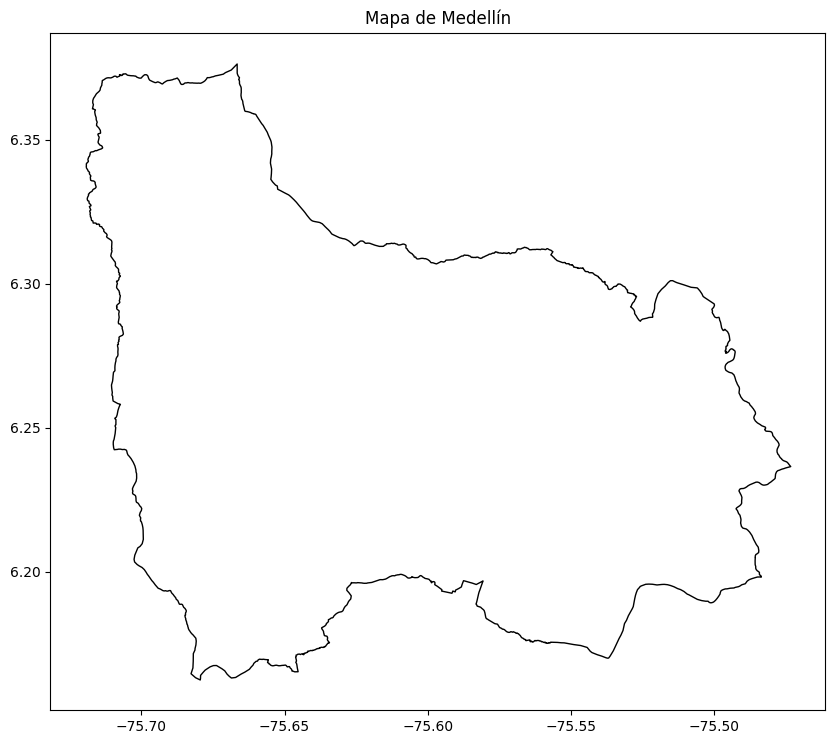

In [ ]:
# Obtener el mapa de Medellín utilizando osmnx
medellin = ox.geocode_to_gdf('Medellín, Colombia')

# Plotear el mapa de Medellín
fig, ax = plt.subplots(figsize=(10, 10))
medellin.plot(ax=ax, color='white', edgecolor='black')
plt.title('Mapa de Medellín')
plt.show()

# Que otra alternativa existe para obtener un mapa de Medellin?

Generalmente, las ciudades cuentan con archivos de tipo shapefile (shp) que contienen polígonos que delimitan tanto el perímetro de la ciudad como sus barrios. Estos archivos son útiles para representar de manera precisa los límites geográficos y administrativos. En este proyecto, utilizaremos un archivo shapefile para obtener los límites de los barrios de Medellín. Este archivo está incluido en los archivos del repositorio y se denomina BarrioVereda_2014.shp.

Al cargar este archivo con la funcion gpd.read() se nos cargara un geopandas que contendra una columna llamada "geometry" que contendra el poligono de cada barrio

In [ ]:
#Cargar el archivo shp
barrios = gpd.read_file("/content/BarrioVereda_2014.shp")
barrios.head(5)

,CODIGO,NOMBRE,ABREVIATUR,IDENTIFICA,LIMITECOMU,ZHFISICAGE,LIMITEMUNI,VIGENCIA_F,SUBTIPO_BA,LINK_DOCUM,geometry
0,Inst_15,U.P.B,None,Inst_15,11,None,001,None,1,None,"POLYGON ((-75.58911 6.24447, -75.58900 6.24443..."
1,Inst_18,Cerro Nutibara,None,Inst_18,16,None,001,None,1,None,"POLYGON ((-75.57669 6.23733, -75.57628 6.23612..."
2,0610,Mirador del Doce,None,0610,06,None,001,None,1,None,"POLYGON ((-75.58450 6.30520, -75.58445 6.30519..."
3,1620,El Nogal-Los Almendros,None,1620,16,None,001,None,1,None,"POLYGON ((-75.59551 6.23662, -75.59552 6.23660..."
4,0612,El Triunfo,None,0612,06,None,001,None,1,None,"POLYGON ((-75.58618 6.31007, -75.58616 6.31007..."


# Visualizar el mapa de medellin

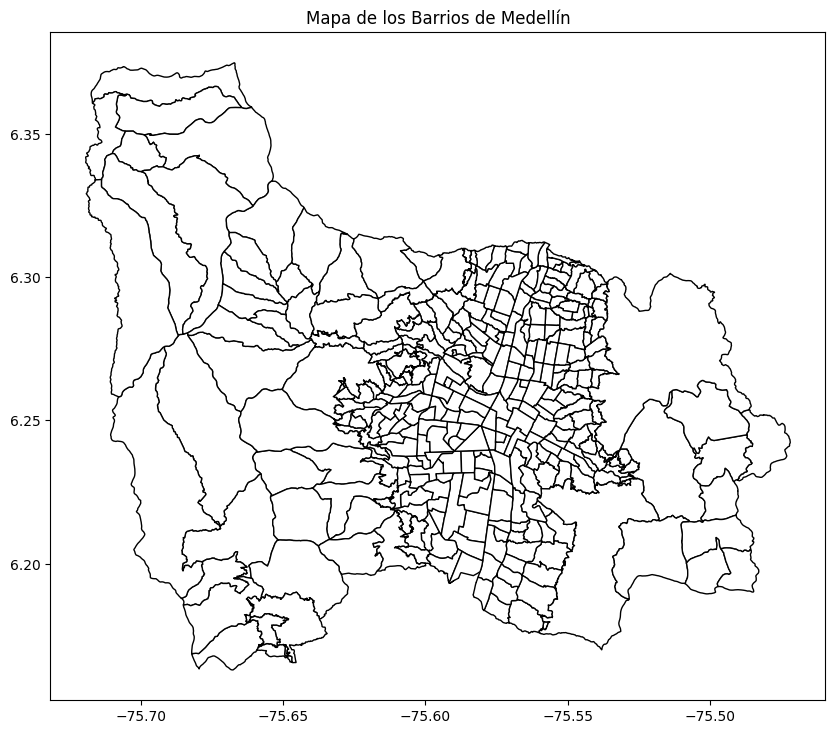

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(ax=ax, edgecolor='black', color='white')
plt.title('Mapa de los Barrios de Medellín')
plt.show()

# Convertir los Datos de Hurtos a un GeoDataFrame
Esto convertira nuestro df original en un GeoDataFrame, si nos fijamos en la columna geometry habra un POINT, a diferencia de nuestro archivo "barrios" que contiene un poligono


In [ ]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,geometry
0,2017-01-01T01:00:00.000-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58202 6.29970)
1,2017-01-01T15:00:00.000-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.56616 6.25092)
2,2017-01-01T14:00:00.000-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55491 6.27484)
3,2017-01-01T16:00:00.000-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.55353 6.27624)
4,2017-01-01T16:00:00.000-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,POINT (-75.58691 6.25034)


# ¿Cómo puedo unir datos de hurtos con información de barrios en Medellín utilizando geopandas?

Para unir los datos de hurtos con la información de los barrios en Medellín, necesitamos utilizar operaciones espaciales que nos permitan relacionar cada registro de hurtos con el barrio correspondiente.

Utilizando la función gpd.sjoin() de geopandas

In [ ]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios, how="left", predicate="within")
print(hurto_barrios.info(verbose=True))

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 284545 entries, 0 to 298782
Data columns (total 48 columns):
 #   Column               Non-Null Count   Dtype   
---  ------               --------------   -----   
 0   fecha_hecho          284545 non-null  object  
 1   cantidad             284545 non-null  float64 
 2   latitud              284545 non-null  float64 
 3   longitud             284545 non-null  float64 
 4   sexo                 284545 non-null  object  
 5   edad                 284545 non-null  int64   
 6   estado_civil         284545 non-null  object  
 7   grupo_actor          284545 non-null  object  
 8   actividad_delictiva  284545 non-null  object  
 9   parentesco           284545 non-null  object  
 10  ocupacion            284545 non-null  object  
 11  discapacidad         284545 non-null  object  
 12  grupo_especial       284545 non-null  object  
 13  medio_transporte     284545 non-null  object  
 14  nivel_academico      284545 non-null  object  
 1

# ¿Cómo puedo contar el número de registros de hurtos por cada barrio en Medellín?

Para realizar esta tarea, necesitamos agrupar los datos por los polígonos de los barrios y contar cuántos registros de hurtos hay dentro de cada uno.

Utilizando el método groupby() de pandas y size()

Utilizamos el método groupby() en el GeoDataFrame hurto_barrios agrupando por la columna index_right, que contiene el índice de los polígonos de los barrios a los que pertenecen los registros de hurtos.

hurto_counts será una serie (o DataFrame si se utiliza reset_index()) que contendrá el número de registros de hurtos por cada índice de polígono de barrio. Cada índice corresponde a un barrio específico en Medellín.

Ademas agregaremos hurto_counts dentro de el df de barrios para tener la metrica de hurtos por barrio

In [ ]:
hurto_counts = hurto_barrios.groupby('index_right').size()
barrios['hurto_count'] = barrios.index.map(hurto_counts).fillna(0)

# ¿Cómo puedo generar un mapa de calor de hurtos por barrios en Medellín usando Matplotlib y Contextily?



Creación de la figura y los ejes sin la base de contextily

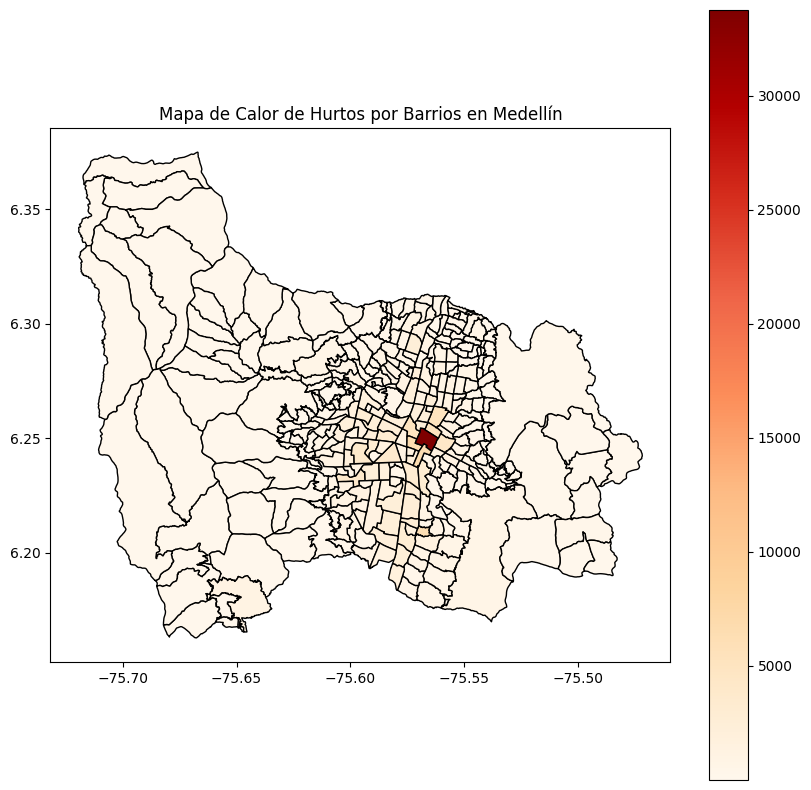

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

Creación de la figura y los ejes con la base de contextily

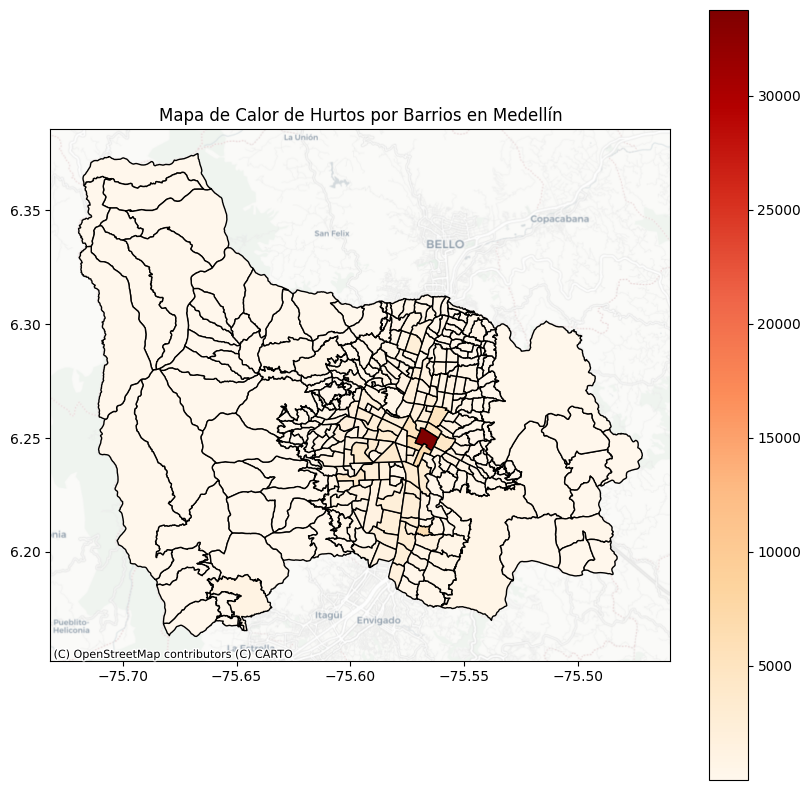

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())
plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

El mapa revela claramente un problema de visualización al mostrar una concentración significativa de hurtos en un barrio específico de Medellín (La Candelaria). Debido a la amplia escala de diferencias entre los datos, es necesario ajustar los intervalos para que las gráficas puedan ofrecer una representación más informativa y detallada.

# ¿Cómo se puede visualizar el mapa de calor de hurtos por barrios en Medellín utilizando esquemas de clasificación basados en quantiles?

Usamos ***classifier = mc.Quantiles(barrios['hurto_count']***, k=12) de la libreria mapclassify: Primero, el programa divide los barrios de Medellín en grupos basados en la cantidad de hurtos que tienen. Esto nos ayuda a ver claramente qué áreas tienen más problemas de seguridad y cuáles menos, podemos modficar el parametro **k** para añadir o quitar cuantiles

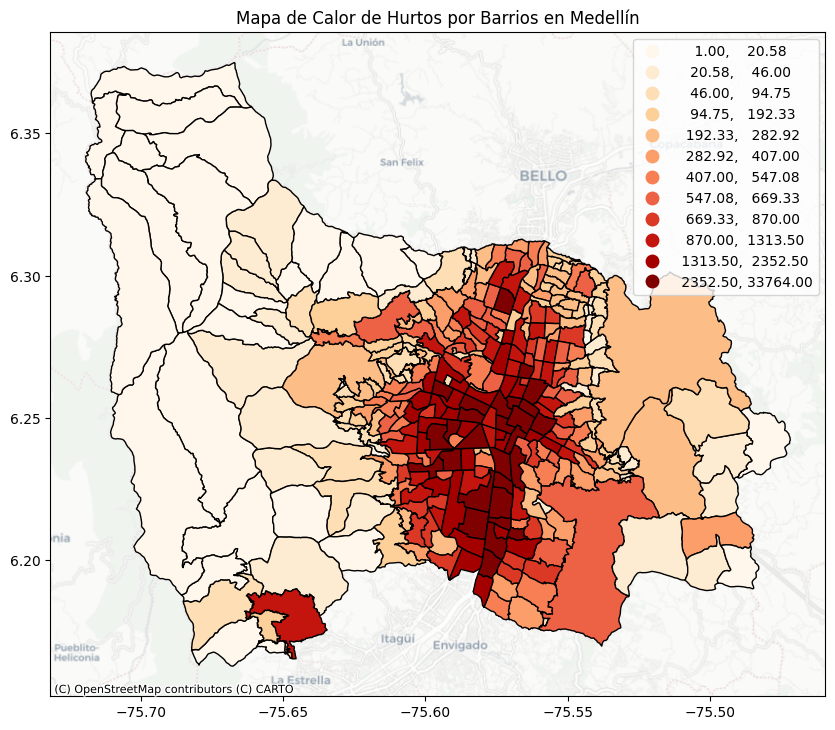

In [ ]:
classifier = mc.Quantiles(barrios['hurto_count'], k=12)
fig, ax = plt.subplots(figsize=(10, 10))
barrios.plot(column='hurto_count', ax=ax, legend=True, cmap='OrRd', scheme='Quantiles', classification_kwds={'k': 12}, edgecolor='black')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=barrios.crs.to_string())

plt.title('Mapa de Calor de Hurtos por Barrios en Medellín')
plt.show()

# Índice de Moran y Contigüidad Reina: Análisis de Autocorrelación Espacial

**¿Qué es el Índice de Moran?**
El Índice de Moran es una medida estadística utilizada para evaluar la autocorrelación espacial de los datos. En términos sencillos, nos ayuda a determinar si los valores similares están agrupados espacialmente (autocorrelación positiva) o si están distribuidos de manera aleatoria (autocorrelación negativa o nula).

**Contigüidad Tipo Reina:**
En el contexto del análisis espacial, la contigüidad tipo reina se refiere a la definición de vecindad entre unidades geográficas, como los barrios en tu caso. Bajo la contigüidad tipo reina, dos unidades geográficas (en este caso, barrios) se consideran vecinas si comparten al menos un punto de su frontera.

Aquí, ***weights.Queen.from_dataframe(barrios)*** crea una matriz de pesos basada en la contigüidad tipo reina a partir de los datos geográficos de los barrios. Esta matriz define qué barrios son vecinos entre sí según la definición de contigüidad reina.

In [ ]:
w = weights.Queen.from_dataframe(barrios)

<ipython-input-49-413fbc792650>:1: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  w = weights.Queen.from_dataframe(barrios)


Cálculo del Índice de Moran:
***moran = esda.Moran(barrios['hurto_count'], w)***

Con la matriz de pesos definida, esda.Moran() calcula el Índice de Moran para la variable hurto_count (número de hurtos) en los barrios. Este índice cuantifica la autocorrelación espacial de los hurtos, ayudando a determinar si hay patrones espaciales significativos en la distribución de los hurtos entre los barrios.

In [ ]:
moran = esda.Moran(barrios['hurto_count'], w)
print("Índice de Moran global:", moran.I)
print("Valor esperado bajo aleatoriedad espacial:", moran.EI)
print("P-valor:", moran.p_norm)
print("Valor Z:", moran.z_norm)

Índice de Moran global: 0.29698116363366467
Valor esperado bajo aleatoriedad espacial: -0.0030211480362537764
P-valor: 9.175439846422924e-21
Valor Z: 9.345155670217965


El Índice de Moran global es una medida que indica la autocorrelación espacial de los datos. En este caso, un valor de 0.297 indica que existe una autocorrelación positiva significativa entre los datos de hurto por barrio en Medellín. Esto significa que los barrios con altos índices de hurto tienden a estar cerca de otros barrios con altos índices, y lo mismo ocurre para los barrios con bajos índices de hurto. Es decir, la distribución de los hurtos no es aleatoria, sino que hay una tendencia a la agrupación espacial.

In [ ]:
gdf_datos_limpios = gpd.GeoDataFrame(
    datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud))
datos_con_barrios = gpd.sjoin(gdf_datos_limpios, barrios, how="left", op='within')

# Vamos a determinar con que armas se esta robando en medellin

Este código agrupa los datos del DataFrame hurto_barrios según dos criterios: el nombre del barrio (NOMBRE) y el tipo de arma usado en el hurto (arma_medio). Esto significa que estamos contando cuántas veces ocurre cada combinación de barrio y tipo de arma en los datos de hurto.

Este proceso nos permite obtener una visión clara y cuantitativa de la distribución de los tipos de hurto en los diferentes barrios de Medellín, facilitando análisis posteriores sobre patrones de criminalidad y seguridad urbana.


In [ ]:
frecuencias = hurto_barrios.groupby(['NOMBRE', 'arma_medio']).size().reset_index(name='frecuencia')
frecuencias.head(10)

,NOMBRE,arma_medio,frecuencia
0,Aguas Frias,Arma cortopunzante,3
1,Aguas Frias,Arma de fuego,7
2,Aguas Frias,No,20
3,Aldea Pablo VI,Arma cortopunzante,5
4,Aldea Pablo VI,Arma de fuego,8
5,Aldea Pablo VI,No,18
6,Alejandro Echavarría,Arma cortopunzante,142
7,Alejandro Echavarría,Arma de fuego,235
8,Alejandro Echavarría,Escopolamina,4
9,Alejandro Echavarría,No,365


Visualizando los tipos de armas que se usan en medellin para los hurtos usando un simple grafico de barras, En el dataframe original, el tipo de arma **"No"** se refiere a un hurto sin uso de arma, por lo que de aqui en adelante es importante tener esta informacion clara.

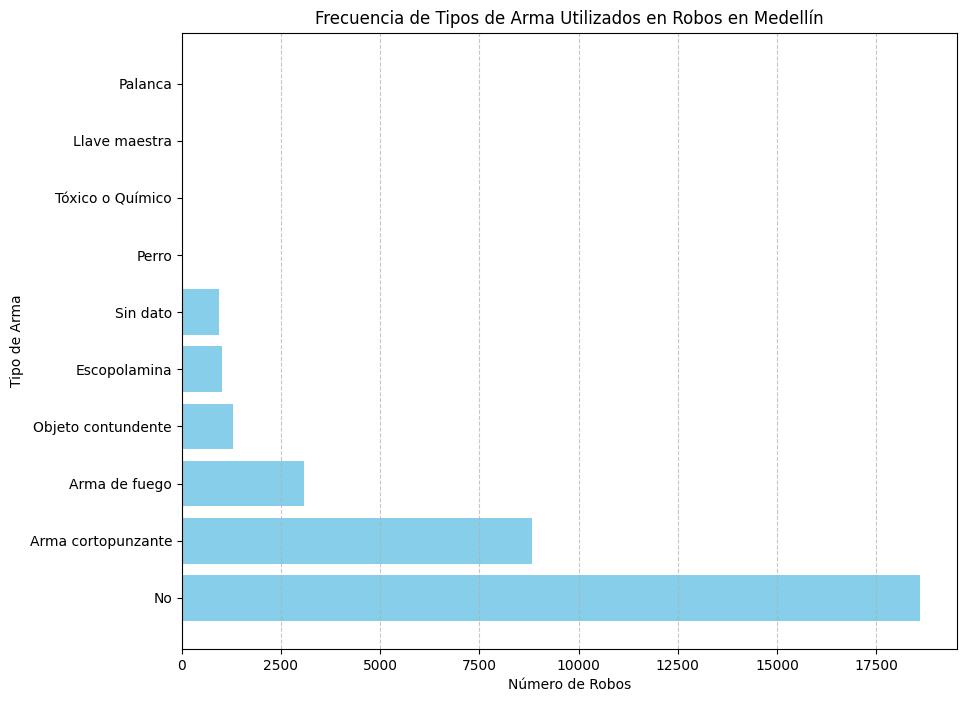

In [ ]:
frecuencias = frecuencias.sort_values(by='frecuencia', ascending=False)
plt.figure(figsize=(10, 8))
bars = plt.barh(frecuencias['arma_medio'], frecuencias['frecuencia'], color='skyblue')

plt.xlabel('Número de Robos')
plt.ylabel('Tipo de Arma')
plt.title('Frecuencia de Tipos de Arma Utilizados en Robos en Medellín')
plt.grid(axis='x', linestyle='--', alpha=0.7)


# ¿Cómo se calcula la probabilidad de ocurrencia de robos con diferentes tipos de armas en cada barrio de Medellín?



*   Primero, agrupamos los datos de los robos por el tipo de arma utilizada y por cada barrio de Medellín. Esto nos permite contar cuántas veces se ha reportado un robo con un tipo específico de arma en cada barrio, lo cual hicimos anteriormente y esta en la variable **frecuencias**
*   Luego, calculamos el total de robos ocurridos en cada barrio sumando las frecuencias de todos los tipos de armas.

*   Para obtener la probabilidad de que un robo en un barrio específico sea cometido con cierto tipo de arma, dividimos la frecuencia de ese tipo de arma en ese barrio entre el total de robos en ese mismo barrio.






In [ ]:
total_por_barrio = frecuencias.groupby('NOMBRE')['frecuencia'].sum()
frecuencias['probabilidad'] = frecuencias.apply(lambda row: row['frecuencia'] / total_por_barrio[row['NOMBRE']], axis=1)
frecuencias.head(10)

,NOMBRE,arma_medio,frecuencia,probabilidad
771,La Candelaria,No,18599,0.550853
768,La Candelaria,Arma cortopunzante,8824,0.261343
691,Guayaquil,No,4124,0.624470
515,El Poblado,No,3822,0.596721
769,La Candelaria,Arma de fuego,3082,0.091281
120,Barrio Colón,No,2709,0.419090
1389,San Benito,No,2325,0.451544
117,Barrio Colón,Arma cortopunzante,2304,0.356436
1710,Villa Nueva,No,1958,0.372456
1351,Prado,No,1885,0.360008


## ¿Cómo se visualizan las probabilidades de robos con diferentes armas en cada barrio de Medellín utilizando Python?



# Crear el mapa interactivo:
Aquí, se crea un objeto Map de Folium centrado en Medellín (location=[6.2442, -75.5918]) con un nivel de zoom inicial de 12 y utilizando el conjunto de teselas (tiles) de mapa de CartoDB Positron.


In [ ]:
m = folium.Map(location=[6.2442, -75.5918], zoom_start=12, tiles='CartoDB positron')

# Agregar datos de probabilidades de armas por barrio:




In [ ]:
for idx, row in frecuencias.iterrows():
    # Encontrar el polígono del barrio en el GeoDataFrame de barrios
    barrio_polygon = barrios[barrios['NOMBRE'] == row['NOMBRE']]['geometry'].values[0]
    barrio_centroid = barrio_polygon.centroid

    # Agregar un círculo al centro de cada barrio con tamaño proporcional a la probabilidad de ser robado con cierta arma
    folium.CircleMarker(
        location=[barrio_centroid.y, barrio_centroid.x],
        radius=row['probabilidad'],
        popup=f"Barrio: {row['NOMBRE']}<br>Arma: {row['arma_medio']}<br>Probabilidad: {row['probabilidad']:.2f}",
        color='crimson',
        fill=True,
        fill_color='crimson',
        fill_opacity=0.7,
        line_opacity=0.2
    ).add_to(m)

# Mostrar el mapa interactivo:
En este mapa interactivo, cada círculo representa un barrio de Medellín. Al hacer clic en cualquier barrio, se despliega información sobre el arma con mayor probabilidad de ser utilizada en robos dentro de ese barrio, junto con la probabilidad asociada. Es importante aclarar que esta probabilidad indica la frecuencia relativa de robos cometidos con esa arma en comparación con otros tipos de armas en el mismo barrio no la probabilidad de ser robado dentro del barrio.


In [ ]:
m